In [1]:
from PIL import Image
import matplotlib.pyplot as plt
plt.rcParams['image.cmap'] = 'gray'
from sklearn.model_selection import train_test_split
import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torchvision import datasets, transforms, utils
from tqdm.auto import tqdm
import functools as ft

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [3]:
def load_sudoku_images(path, total, device):
    sudoku_img = torch.empty(total,8*28,8*28, device=device)
    transform = transforms.ToTensor()
    for i in tqdm(range(total), 'sudoku images'):
        sudoku_img[i] = transform(Image.open(f'{path}/{i}.png'))
    return sudoku_img

In [4]:
def as_digit_images(sudoku_img):
    return torch.stack(torch.split(
        torch.stack(torch.split(sudoku_img, [28]*8, dim=-2), dim=-3),
        [28]*8, dim=-1), dim=-3)

In [5]:
#sudoku_img = load_sudoku_images('data/query', 10000, device)
#torch.save(sudoku_img, 'data/pt-cache/query_sudoku_img.pt')
#sudoku_img = torch.load('data/pt-cache/query_sudoku_img.pt')

In [6]:
#digit_img = as_digit_images(sudoku_img)
#torch.save(digit_img, 'data/pt-cache/query_digit_img.pt')
digit_img = torch.load('data/pt-cache/query_digit_img.pt')

In [7]:
full_X = digit_img.view(-1,1,28,28)
full_y = torch.load('data/pt-cache/query_y.pt')
class_size = torch.min(torch.bincount(full_y))
bal_X = torch.cat([full_X[full_y==i][:class_size] for i in range(9)])
bal_y = torch.cat([full_y[full_y==i][:class_size] for i in range(9)])
train_X, test_X, train_y, test_y = train_test_split(
    bal_X, bal_y, test_size=10000, stratify=bal_y)

In [38]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.m1 = nn.Sequential(nn.Linear(100,200), nn.ReLU())
        self.m2 = nn.Sequential(nn.Linear(9,1000), nn.ReLU())
        self.m3 = nn.Sequential(nn.Linear(1200,784), nn.Sigmoid())
        self.d = nn.Dropout(0.0)
        
    def forward(self, Z, Y):
        return self.m3(self.d(torch.cat((self.m1(Z), self.m2(Y)), dim=-1))).view(-1,1,28,28)

In [39]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.m1 = nn.Sequential(nn.Linear(784,1200), nn.MaxPool1d(5,5))
        self.m2 = nn.Sequential(nn.Linear(9,250), nn.MaxPool1d(5,5))
        self.m3 = nn.Sequential(nn.Linear(290,960), nn.MaxPool1d(4,4))
        self.m4 = nn.Linear(240,1)
        self.d = nn.Dropout(0.5)
        
    def forward(self, X, Y):
        X = X.view(-1,1,784)
        Y = Y.view(-1,1,9)
        return self.m4(self.d(self.m3(self.d(torch.cat((self.m1(X), self.m2(Y)), dim=-1)))))[:,0,:]

In [40]:
def viz_images(img):
    plt.imshow(utils.make_grid(img.detach().cpu(), nrow=10).permute(1,2,0))

In [41]:
gen = Generator().to(device)
disc = Discriminator().to(device)
disc_opt = optim.SGD(disc.parameters(), lr=0.1, momentum=0.5)
gen_opt = optim.SGD(gen.parameters(), lr=0.1, momentum=0.5)
disc_lrs = optim.lr_scheduler.ExponentialLR(disc_opt, gamma=1/1.00004)
gen_lrs = optim.lr_scheduler.ExponentialLR(gen_opt, gamma=1/1.00004)
train_loader = DataLoader(TensorDataset(train_X.to(device), train_y.to(device)), batch_size=100, shuffle=True)
criterion = nn.BCEWithLogitsLoss()

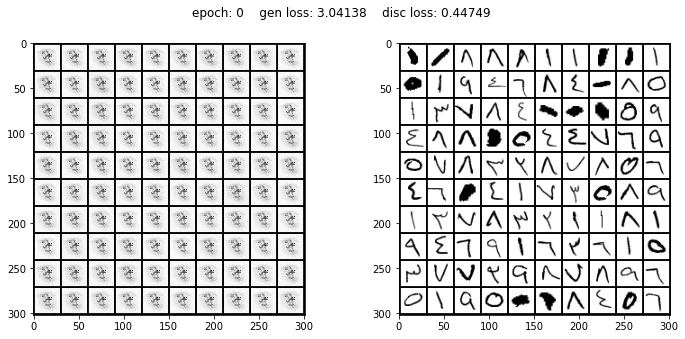

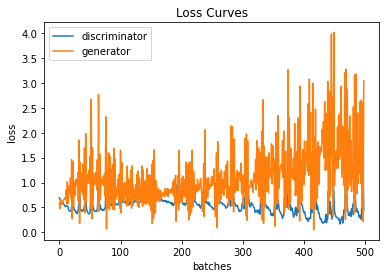

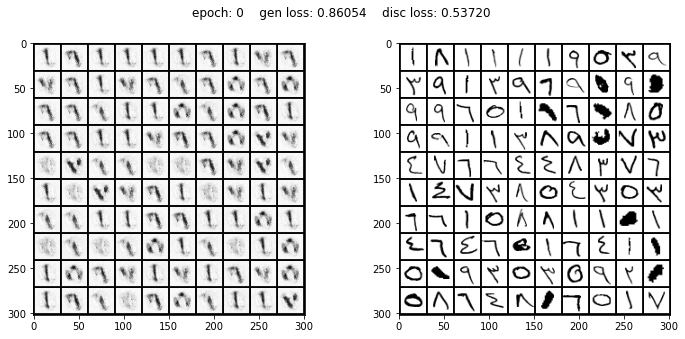

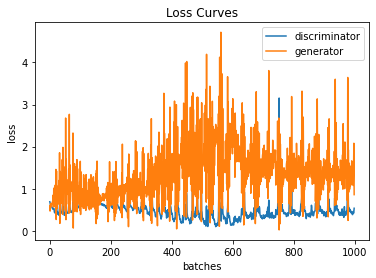

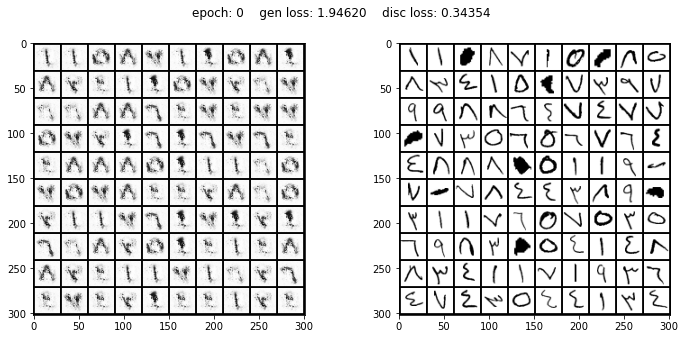

...

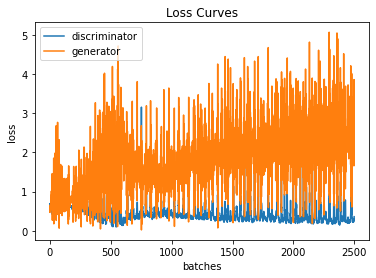

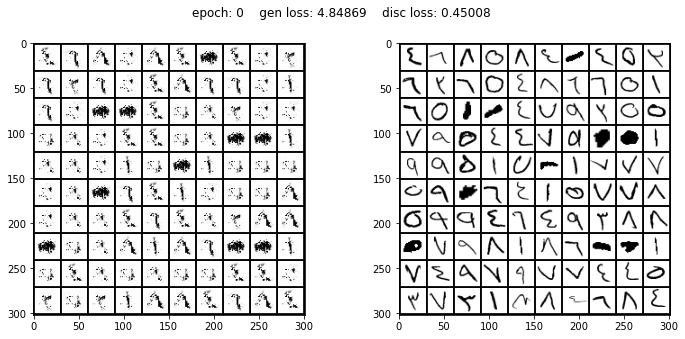

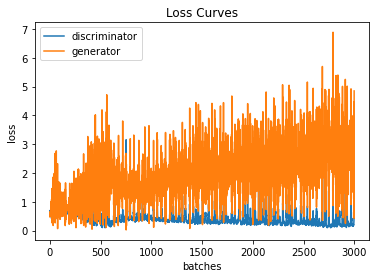

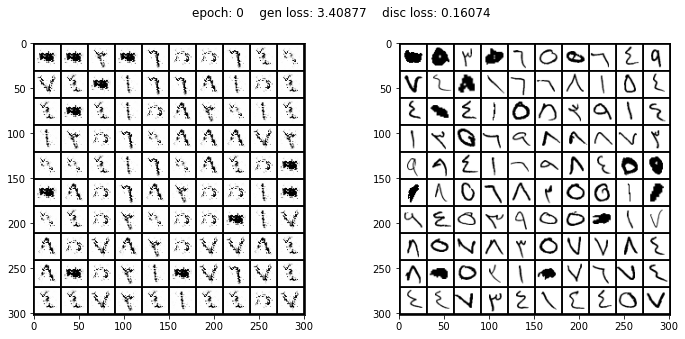

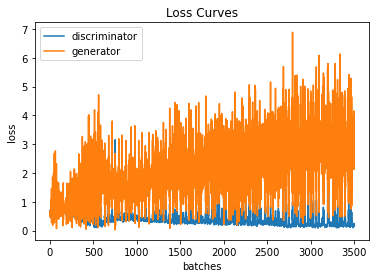


gen.state_dict() saved in: data/pt-cache/nodrop_gen.0.pt
disc.state_dict() saved in: data/pt-cache/nodrop_disc.0.pt


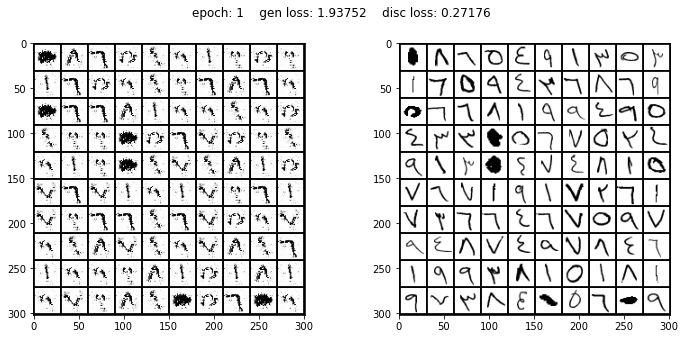

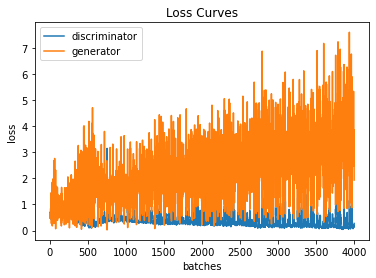

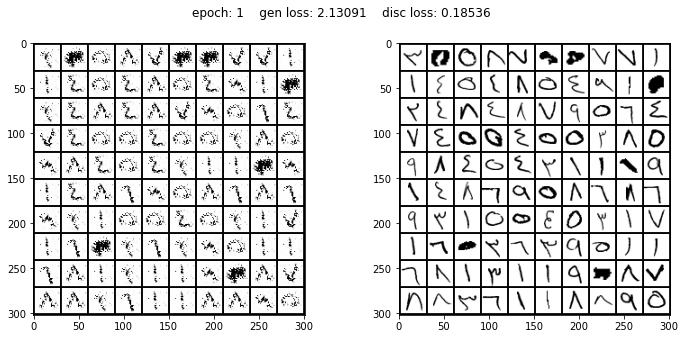

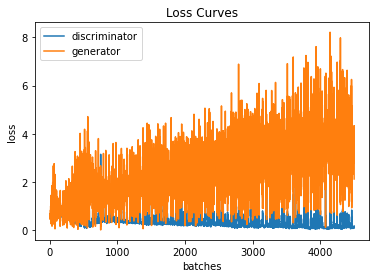

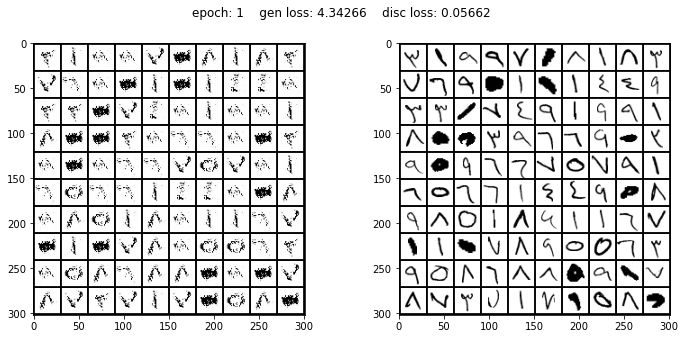

...

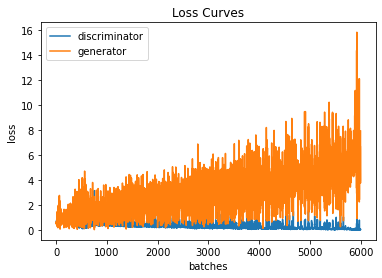

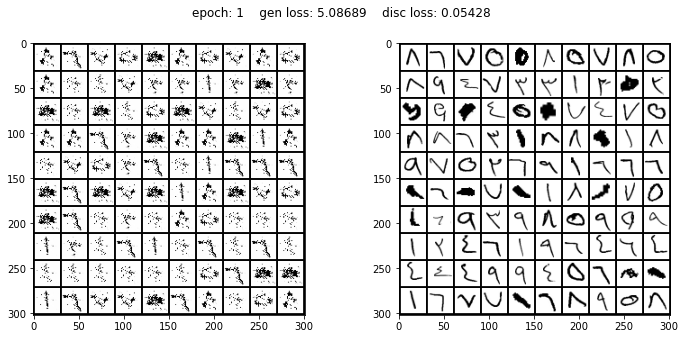

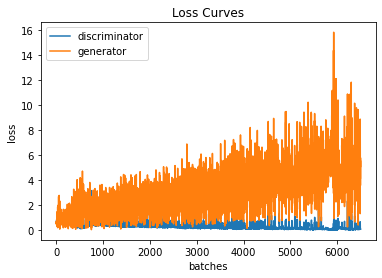

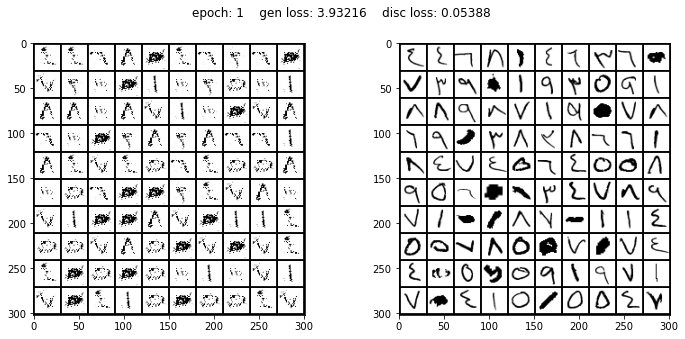

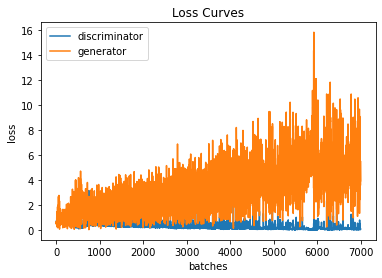


gen.state_dict() saved in: data/pt-cache/nodrop_gen.1.pt
disc.state_dict() saved in: data/pt-cache/nodrop_disc.1.pt


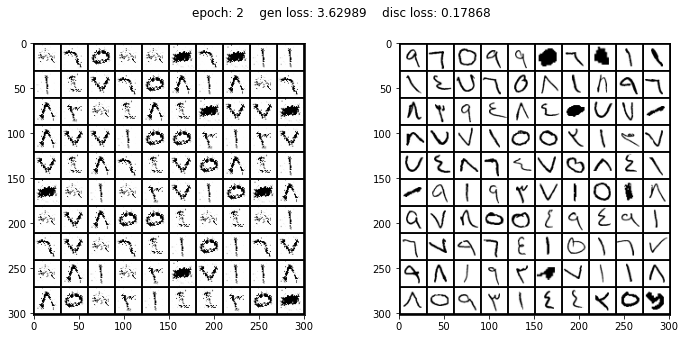

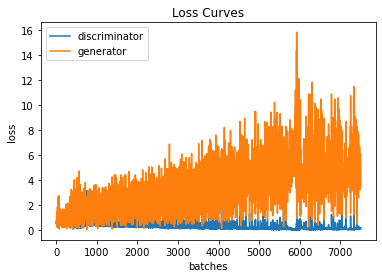

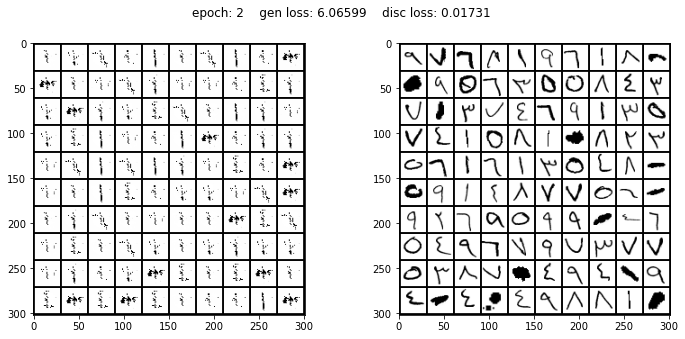

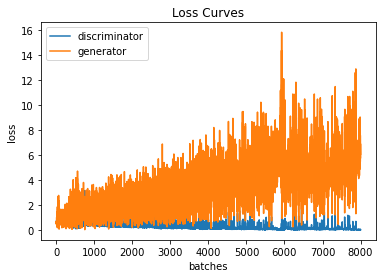

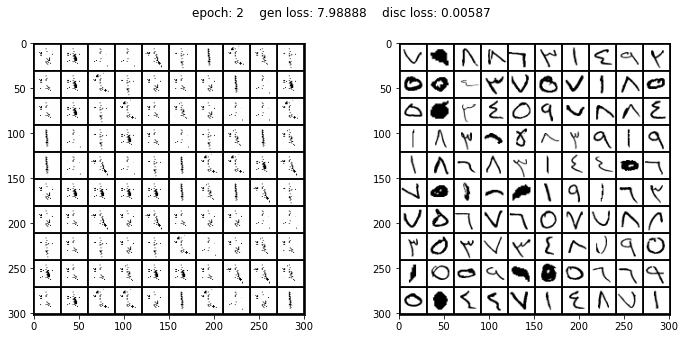

...

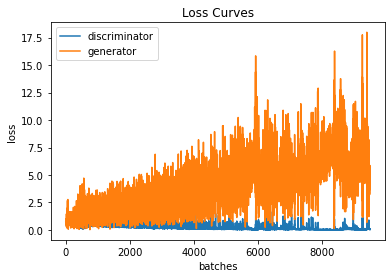

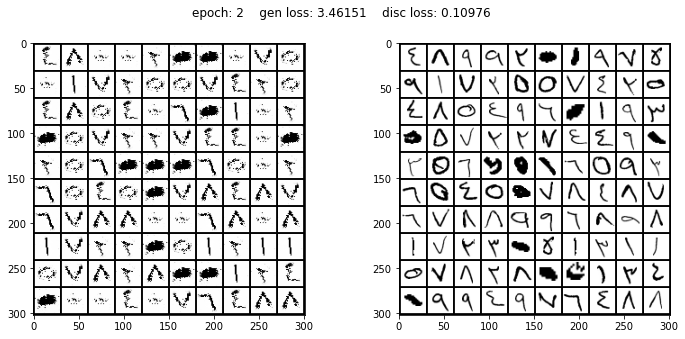

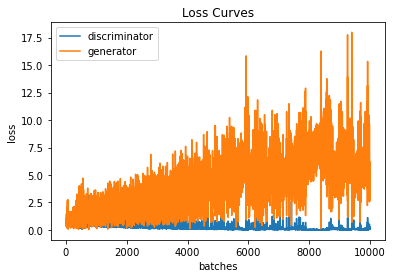

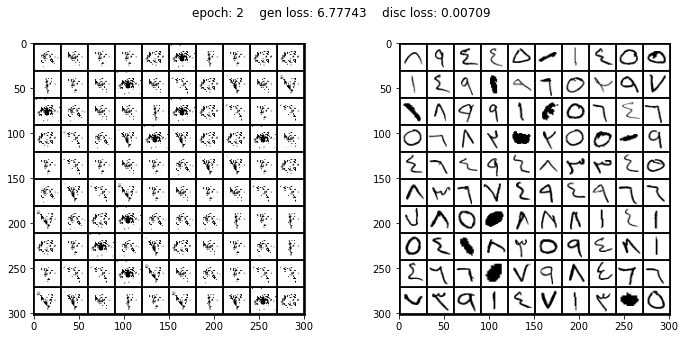

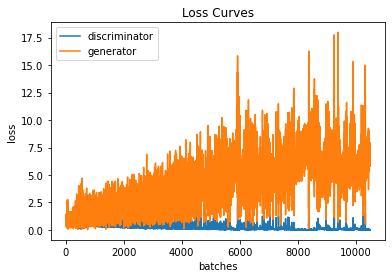


gen.state_dict() saved in: data/pt-cache/nodrop_gen.2.pt
disc.state_dict() saved in: data/pt-cache/nodrop_disc.2.pt


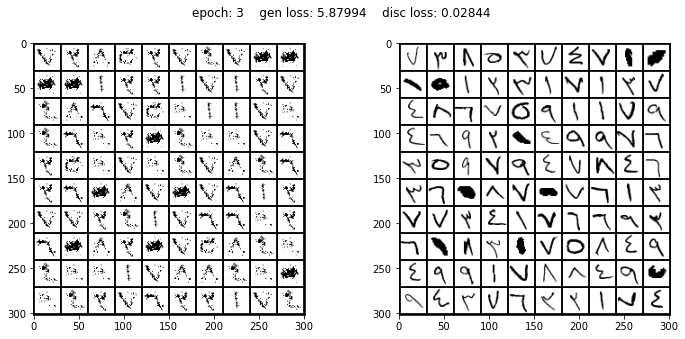

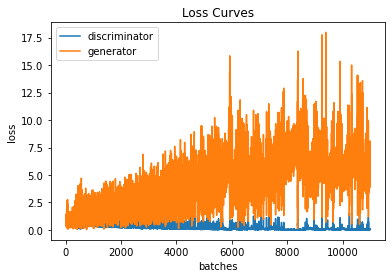

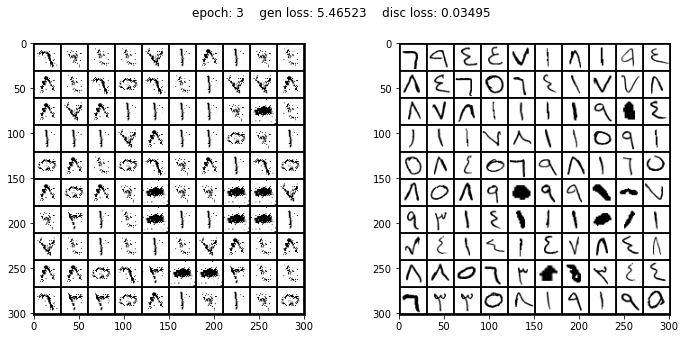

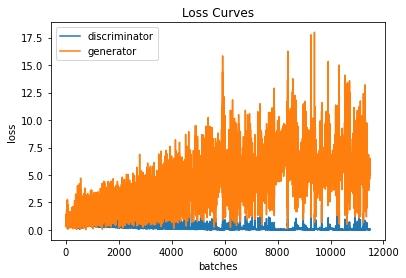

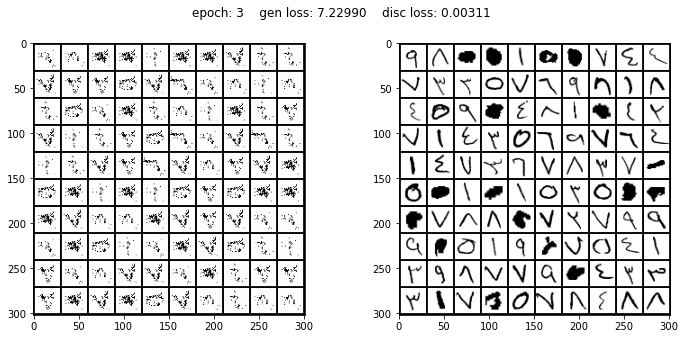

...

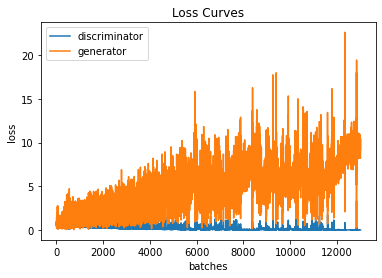

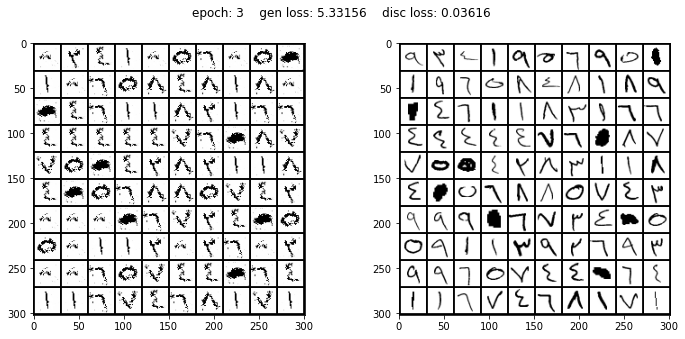

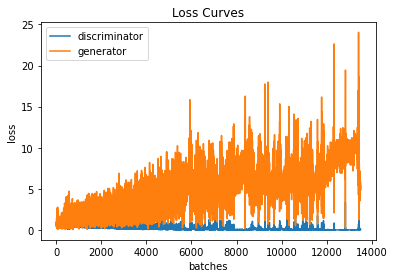

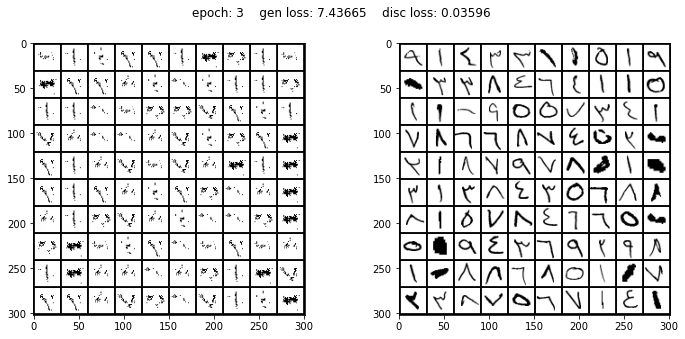

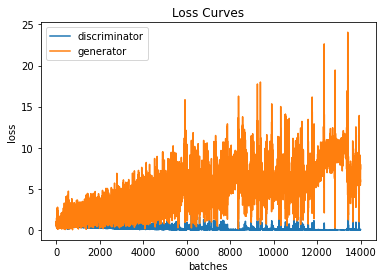


gen.state_dict() saved in: data/pt-cache/nodrop_gen.3.pt
disc.state_dict() saved in: data/pt-cache/nodrop_disc.3.pt


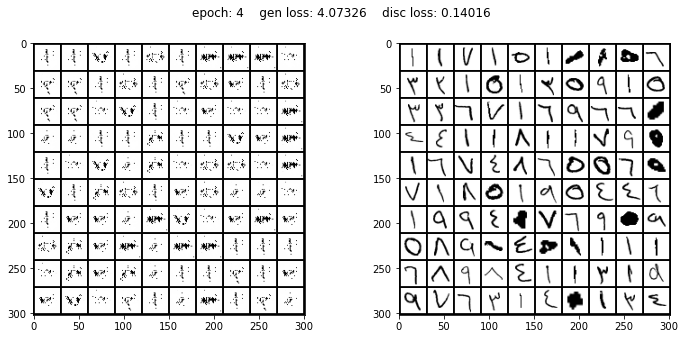

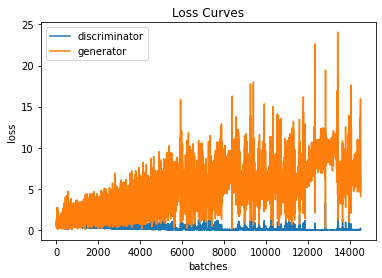

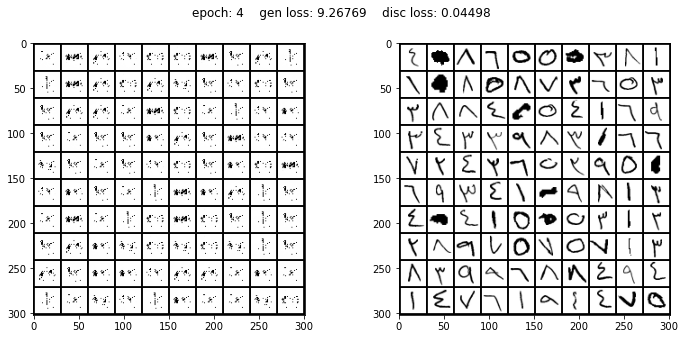

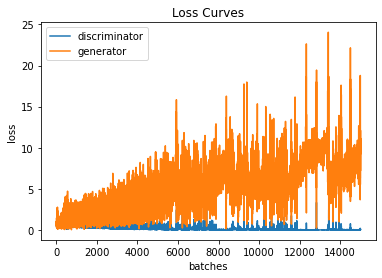

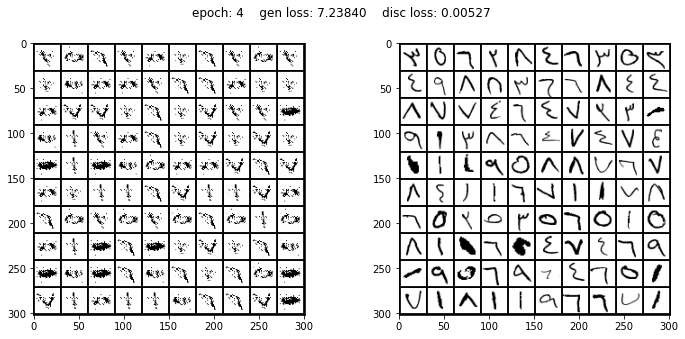

...

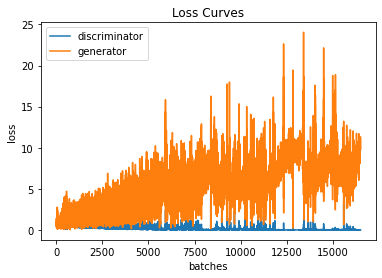

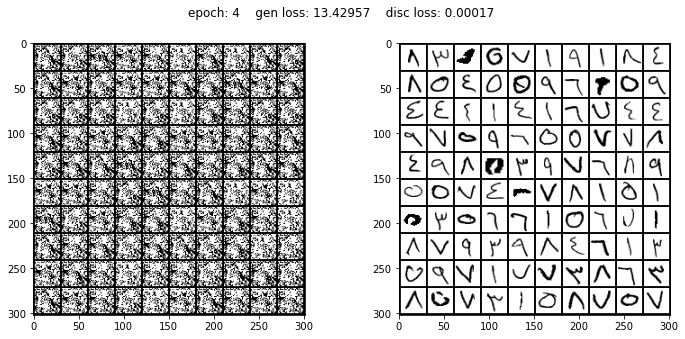

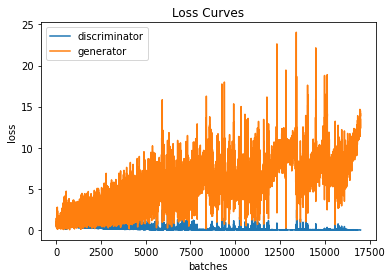

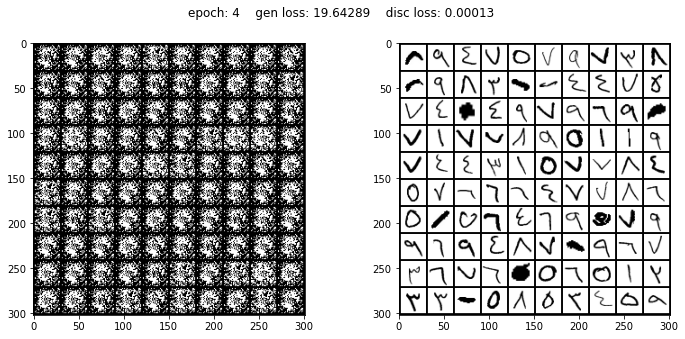

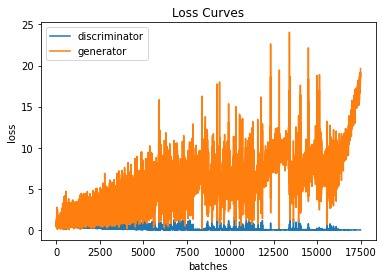


gen.state_dict() saved in: data/pt-cache/nodrop_gen.4.pt
disc.state_dict() saved in: data/pt-cache/nodrop_disc.4.pt


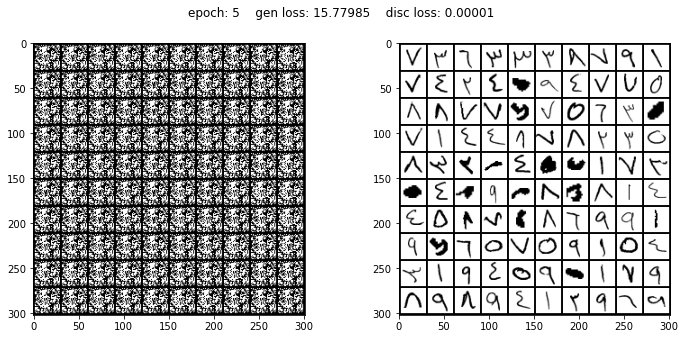

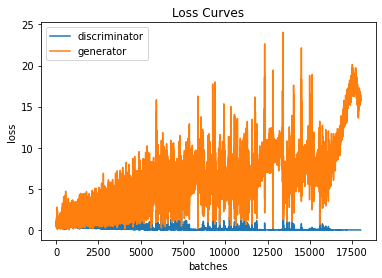

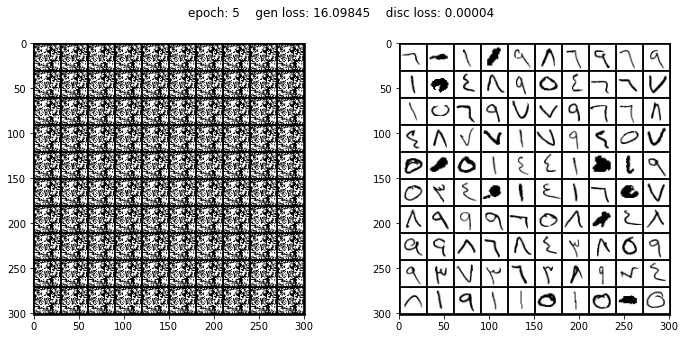

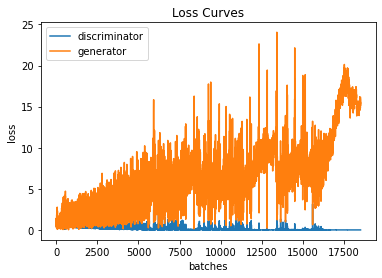

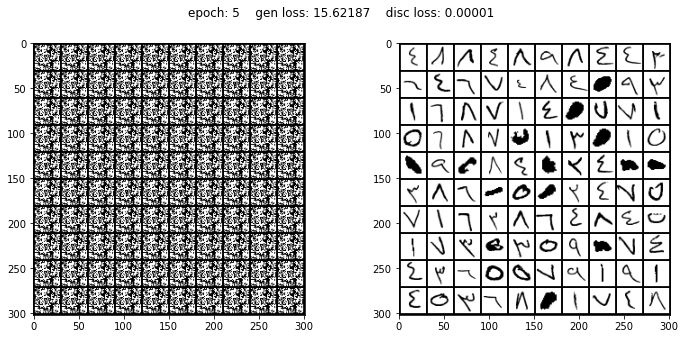

...

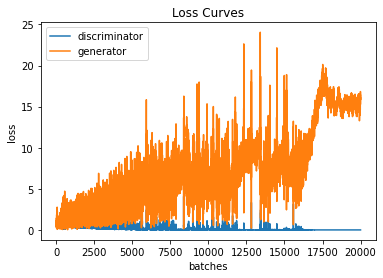

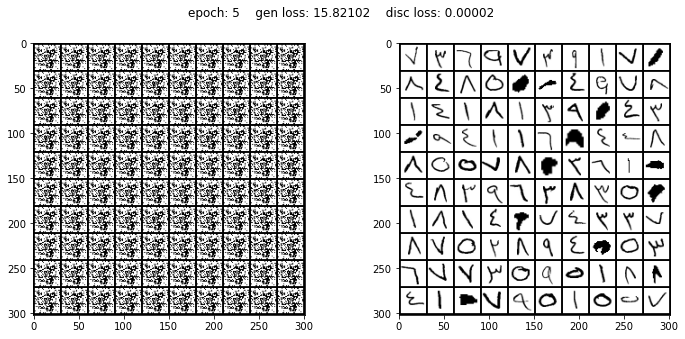

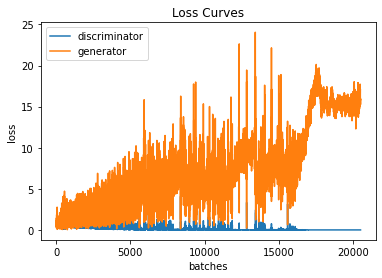

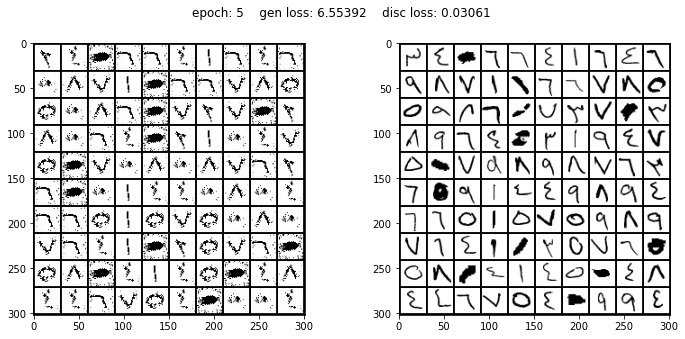

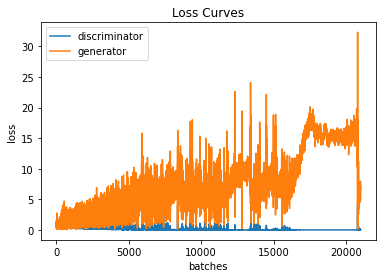


gen.state_dict() saved in: data/pt-cache/nodrop_gen.5.pt
disc.state_dict() saved in: data/pt-cache/nodrop_disc.5.pt


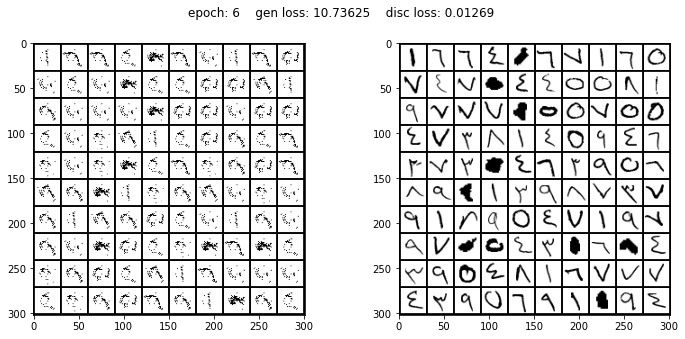

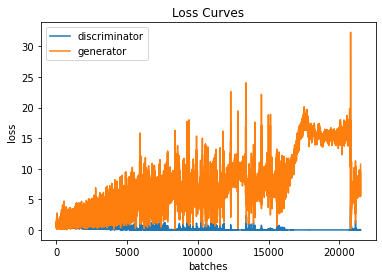

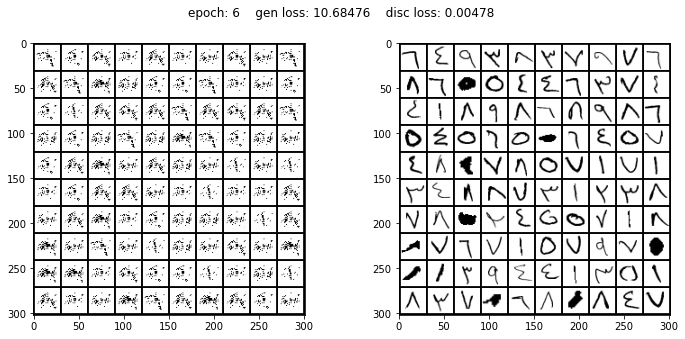

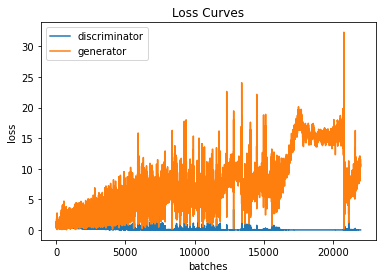

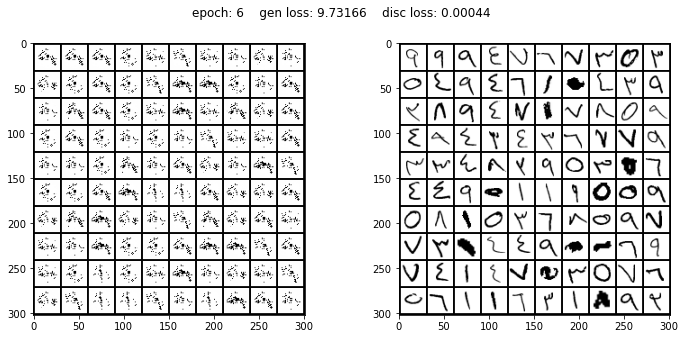

...

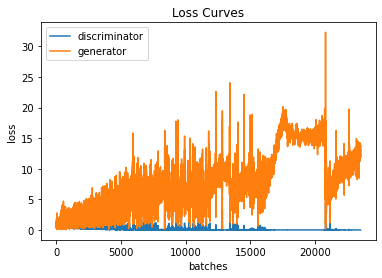

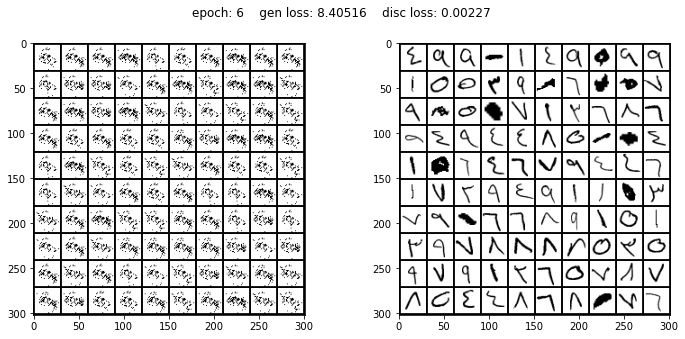

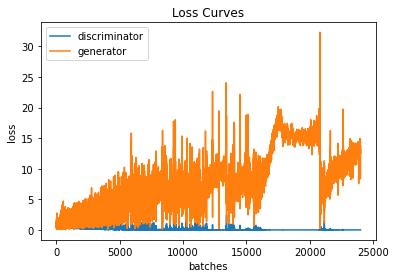

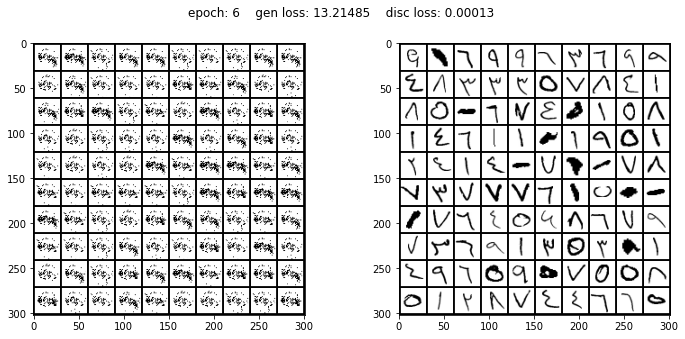

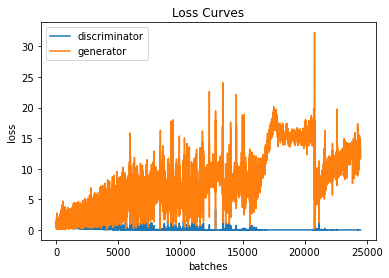


gen.state_dict() saved in: data/pt-cache/nodrop_gen.6.pt
disc.state_dict() saved in: data/pt-cache/nodrop_disc.6.pt


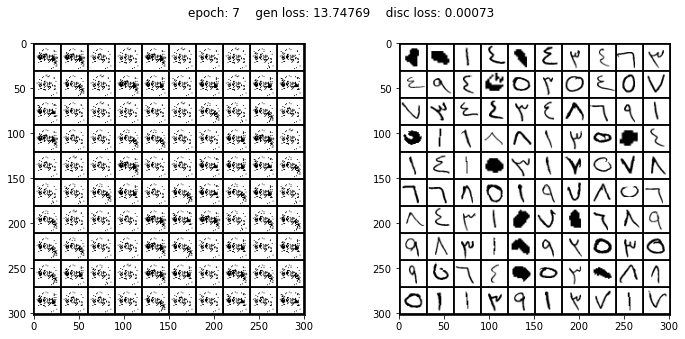

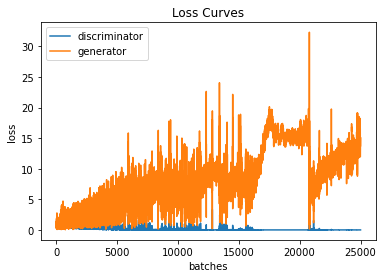

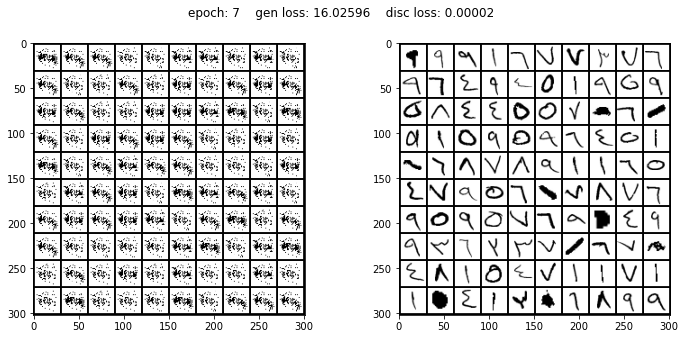

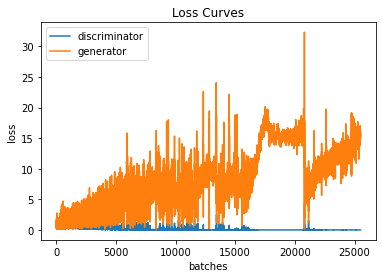

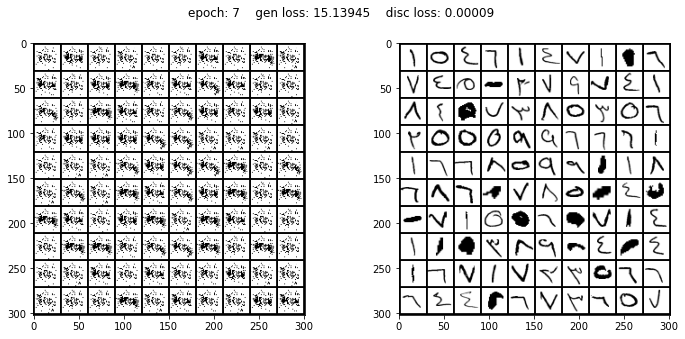

...

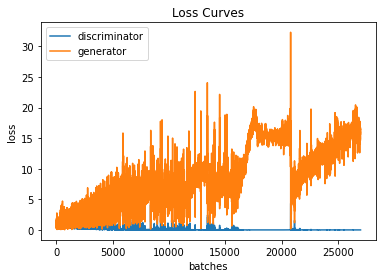

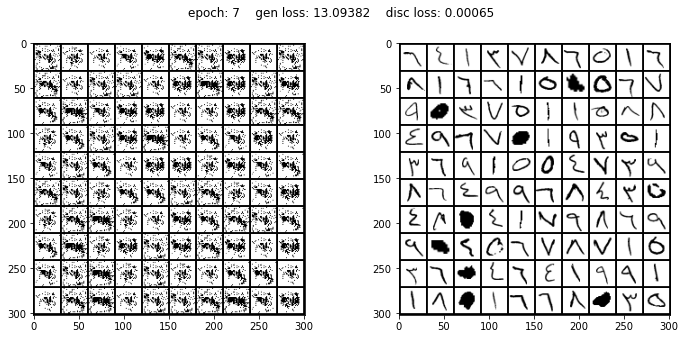

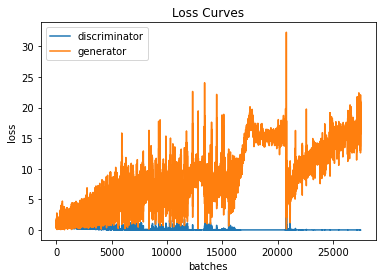

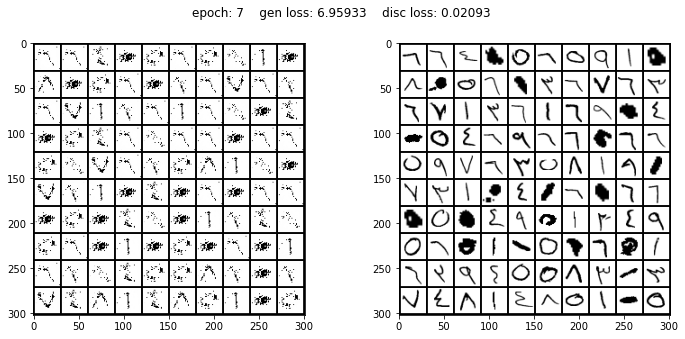

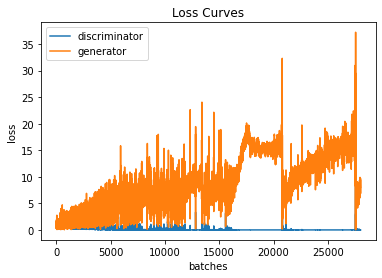


gen.state_dict() saved in: data/pt-cache/nodrop_gen.7.pt
disc.state_dict() saved in: data/pt-cache/nodrop_disc.7.pt


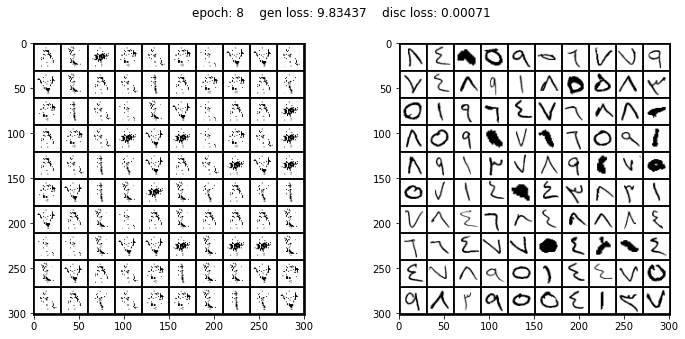

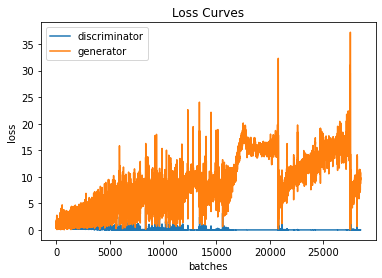

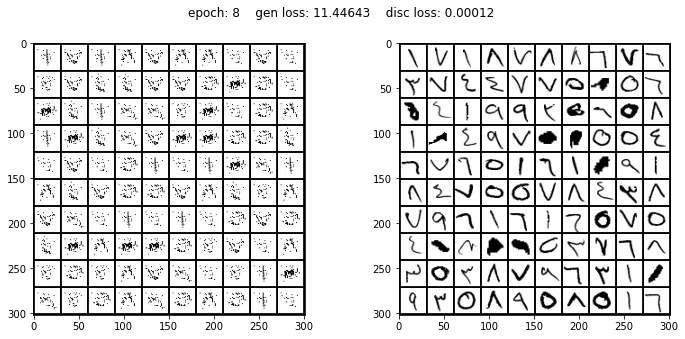

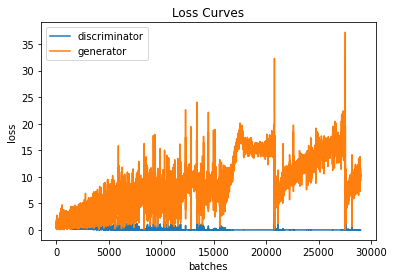

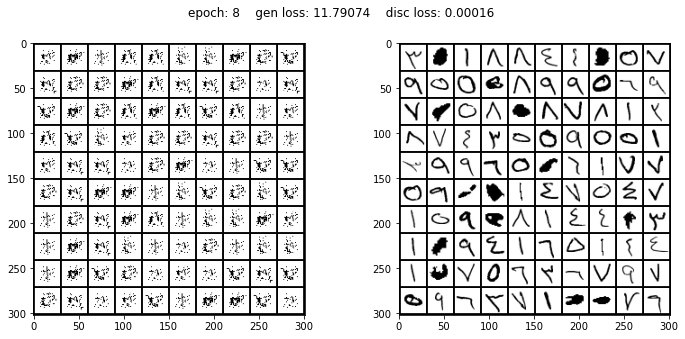

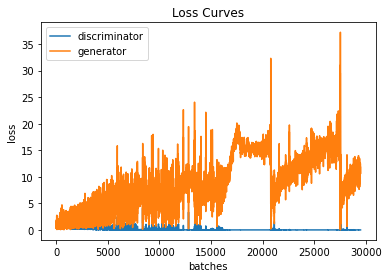

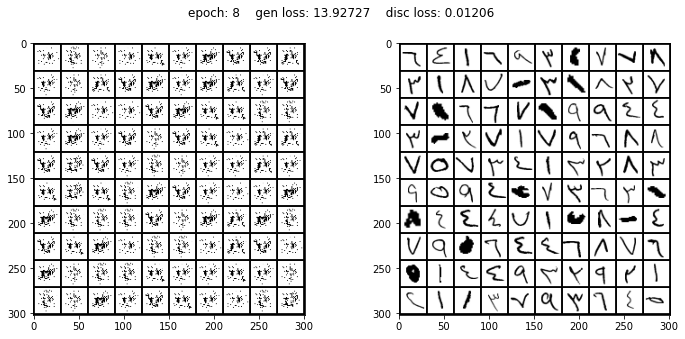

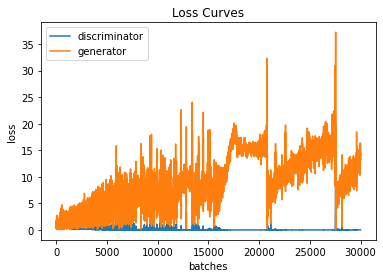

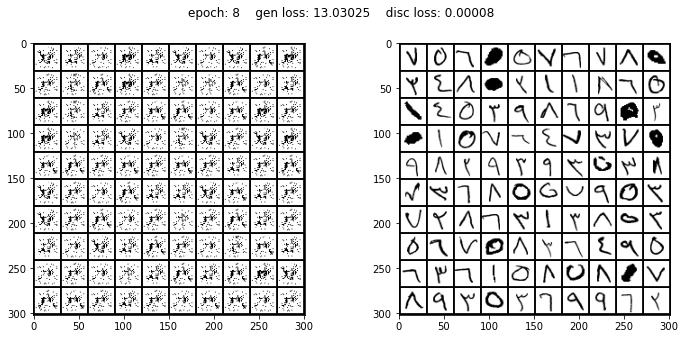

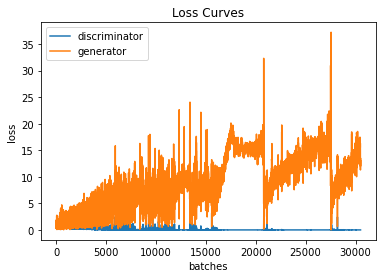

KeyboardInterrupt: 

In [42]:
n_epochs = 100
disc_losses = []
gen_losses = []
# tqdm.__init__ = ft.partialmethod(tqdm.__init__, disable=True)
ctr = 0
for epoch in tqdm(range(n_epochs), 'epochs'):
    for real_X, real_y in tqdm(train_loader, 'batches'):
        ctr += 1
        
        real_Y = F.one_hot(real_y.long(), num_classes=9).float()
        real_yhat = disc(real_X, real_Y)
        real_loss = criterion(real_yhat, torch.ones_like(real_yhat))
        
        Z = torch.rand(real_X.shape[0],100, device=device)
        fake_X = gen(Z, real_Y)
        fake_yhat = disc(fake_X, real_Y)
        fake_loss = criterion(fake_yhat, torch.zeros_like(fake_yhat))
        
        disc_loss = (real_loss + fake_loss)/2
        disc_opt.zero_grad()
        disc_loss.backward(retain_graph=True)
        nn.utils.clip_grad_norm_(disc.parameters(), 5)
        disc_opt.step()
        disc_losses.append(disc_loss.item())
        
        gen_loss = criterion(fake_yhat, torch.ones_like(fake_yhat))
        gen_opt.zero_grad()
        gen_loss.backward()
        nn.utils.clip_grad_norm_(gen.parameters(), 5)
        gen_opt.step()
        gen_losses.append(gen_loss.item())
        
        if ctr % 500 == 499:
            plt.figure(figsize=(12,5))
            plt.subplot(121)
            viz_images(fake_X)
            plt.subplot(122)
            viz_images(real_X)
            plt.suptitle(f'epoch: {epoch}    gen loss: {gen_loss:.5f}    disc loss: {disc_loss:.5f}')
            plt.show()
            plt.close()

            plt.figure()
            plt.plot(disc_losses, label='discriminator')
            plt.plot(gen_losses, label='generator')
            plt.legend()
            plt.xlabel('batches')
            plt.ylabel('loss')
            plt.title('Loss Curves')
            plt.show()
            plt.close()
        
    disc_lrs.step()
    gen_lrs.step()

    torch.save(gen.state_dict(), f'data/pt-cache/nodrop_gen.{epoch}.pt')
    print(f'gen.state_dict() saved in: data/pt-cache/nodrop_gen.{epoch}.pt')
    torch.save(disc.state_dict(), f'data/pt-cache/nodrop_disc.{epoch}.pt')
    print(f'disc.state_dict() saved in: data/pt-cache/nodrop_disc.{epoch}.pt')